# An Image Classification Example: Dolphin vs. Giraffe

In [1]:
%matplotlib inline

## Start a CAS session

In [2]:
import swat

sess = swat.CAS(cashost, casport)

Load `ImageTable` from `DLPy`.  This is a specialized `CASTable` class for image processing.

In [3]:
from dlpy.images import ImageTable

## Load images

`img_path` should be a fully-qualified directory that is accessible by the CAS server session.
The folder structure is as follows:

   * Giraffe_Dolphin
       * Giraffe
           * Giraffe image 1
           * Girrafe image 2
           * ...
       * Dolphin
           * Dolphin image 1
           * Dolphin image 2
           * ...
           
We are using giraffe and dolphin images in this example.  Your case may differ.

In [4]:
img_path='/path/to/images/Giraffe_Dolphin'

my_images = ImageTable.load_files(sess, path=img_path)

In [5]:
my_images.head()

,_image_,_label_,_filename_0
0,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,Giraffe,giraffe_10001.jpg
1,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,Giraffe,giraffe_10003.jpg
2,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,Giraffe,giraffe_10018.jpg
3,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,Giraffe,giraffe_10022.jpg
4,b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01...,Giraffe,giraffe_10035.jpg


In [6]:
my_images.columninfo()

,Column,ID,Type,RawLength,FormattedLength,NFL,NFD
0,_image_,1,varbinary,1075587,1075587,0,0
1,_label_,2,varchar,7,7,0,0
2,_filename_0,3,varchar,17,17,0,0


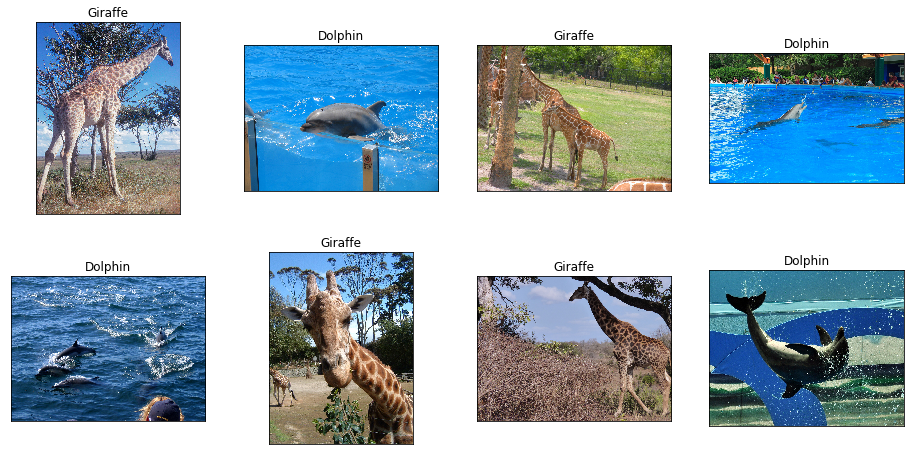

In [7]:
my_images.show(nimages=8, ncol=4, randomize=True)

In [8]:
my_images.label_freq

,Level,Frequency
Dolphin,1,237
Giraffe,2,172


In [9]:
my_images.image_summary

jpg                   409
minWidth              170
maxWidth             1024
minHeight             127
maxHeight            1024
meanWidth         912.147
meanHeight        778.499
mean1stChannel    128.718
min1stChannel           0
max1stChannel         255
mean2ndChannel    124.123
min2ndChannel           0
max2ndChannel         255
mean3rdChannel    94.2449
min3rdChannel           0
max3rdChannel         255
dtype: object

## Image processing

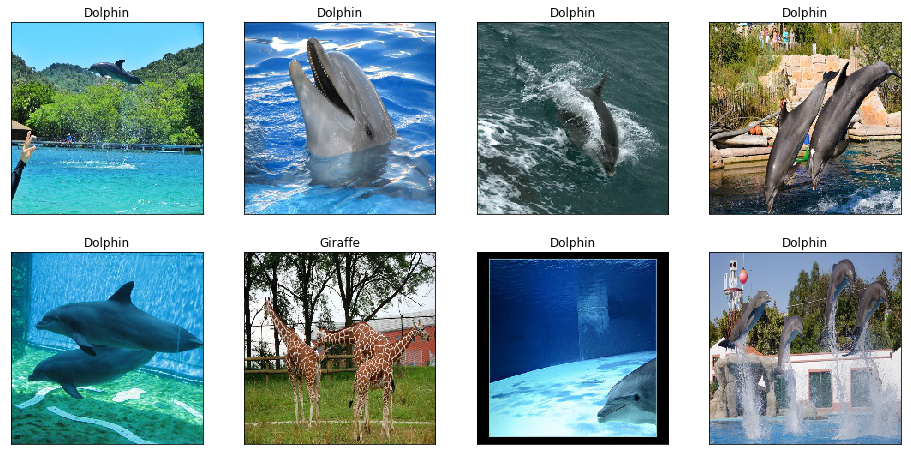

In [10]:
my_images.resize(width=224)
my_images.show(8, 4)

## Splitting the data into training and testing

In [11]:
from dlpy.splitting import two_way_split

In [12]:
tr_img, te_img = two_way_split(my_images, test_rate=20, seed=123)

In [13]:
tr_img.label_freq

,Level,Frequency
Dolphin,1,190
Giraffe,2,138


In [14]:
te_img.label_freq

,Level,Frequency
Dolphin,1,47
Giraffe,2,34


## Training Data Augmentation

In [15]:
tr_img.as_patches(width=200, height=200, step_size=24, output_width=224, output_height=224)

In [16]:
tr_img.label_freq

,Level,Frequency
Dolphin,1,760
Giraffe,2,552


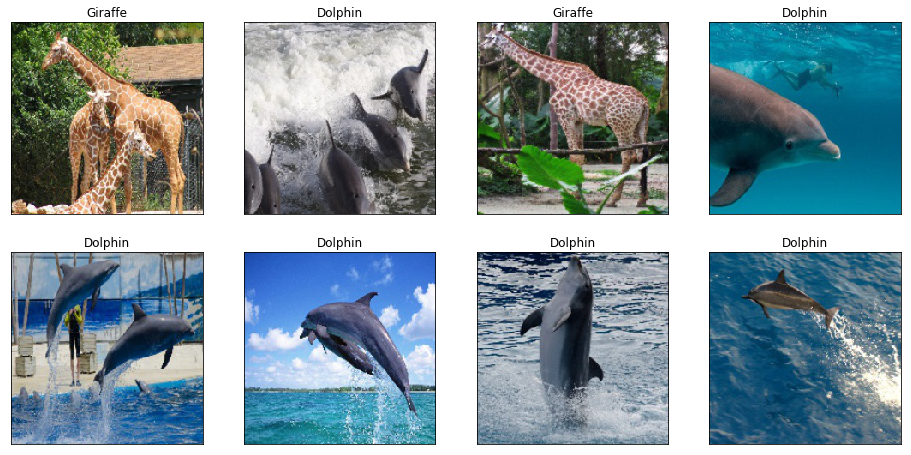

In [17]:
tr_img.show(8,4)

## Model1: Simple CNN

### Build a simple CNN model

In [18]:
from dlpy import Model, Sequential
from dlpy.layers import * 
from dlpy.applications import *

In [19]:
model1 = Sequential(sess, model_table='Simple_CNN')

**Input Layer**

In [20]:
model1.add(InputLayer(3, 224, 224, offsets=tr_img.channel_means))

NOTE: Input layer added.


**1 Convolution 1 Pooling**

In [21]:
model1.add(Conv2d(8, 7))
model1.add(Pooling(2))

NOTE: Convolutional layer added.
NOTE: Pooling layer added.


**1 Convolution 1 Pooling**

In [22]:
model1.add(Conv2d(8, 7))
model1.add(Pooling(2))

NOTE: Convolutional layer added.
NOTE: Pooling layer added.


**1 Dense layer **

In [23]:
model1.add(Dense(16))

NOTE: Fully-connected layer added.


**Output layer **

In [24]:
model1.add(OutputLayer(act='softmax', n=2))

NOTE: Output layer added.
NOTE: Model compiled successfully.


In [25]:
model1.print_summary()

*==================*===============*========*============*=================*======================*
|   Layer (Type)   |  Kernel Size  | Stride | Activation |   Output Size   | Number of Parameters |
*------------------*---------------*--------*------------*-----------------*----------------------*
| Data(Input)      |     None      |  None  |    None    |  (224, 224, 3)  |        0 / 0         |
| Conv1_1(Convo.)  |    (7, 7)     |   1    |    Relu    |  (224, 224, 8)  |       1176 / 8       |
| Pool1(Pool)      |    (2, 2)     |   2    |    Max     |  (112, 112, 8)  |        0 / 0         |
| Conv2_1(Convo.)  |    (7, 7)     |   1    |    Relu    |  (112, 112, 8)  |       3136 / 8       |
| Pool2(Pool)      |    (2, 2)     |   2    |    Max     |   (56, 56, 8)   |        0 / 0         |
| FC1(F.C.)        |  (25088, 16)  |  None  |    Relu    |       16        |     401408 / 16      |
| Output(Output)   |    (16, 2)    |  None  |  Softmax   |        2        |        32 / 2        |


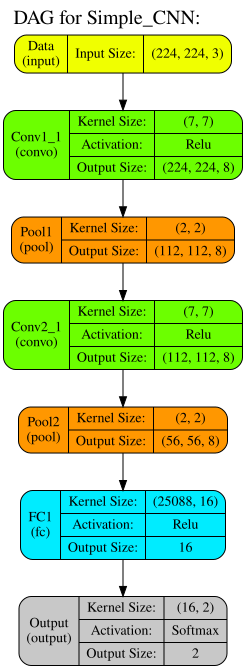

In [26]:
model1.plot_network()

### Model training

In [27]:
model1.fit(data=tr_img, mini_batch_size=2, max_epochs=3, lr=1E-4)

NOTE: Training from scratch.
NOTE:  The Synchronous mode is enabled.
NOTE:  The total number of parameters is 405786.
NOTE:  The approximate memory cost is 1425.00 MB.
NOTE:  Initializing each layer cost       1.14 (s).
NOTE:  The total number of threads on each worker is 32.
NOTE:  The total minibatch size per thread on each worker is 2.
NOTE:  The maximum minibatch size across all workers for the synchronous mode is 64.
NOTE:  Target variable: _label_
NOTE:  Number of levels for the target variable:      2
NOTE:  Levels for the target variable:
NOTE:  Level      0: Dolphin
NOTE:  Level      1: Giraffe
NOTE:  Number of input variables:     1
NOTE:  Number of numeric input variables:      1
NOTE:  Batch              nUsed   Learning Rate     Loss    Fit Error      Time (s) (Training)
NOTE:        0               64  0.0001          7.8534      0.4219         1.00
NOTE:        1               64  0.0001          12.219      0.5313         1.01
NOTE:        2               64  0.0001    

,Descr,Value
0,Model Name,simple_cnn
1,Model Type,Convolutional Neural Network
2,Number of Layers,7
3,Number of Input Layers,1
4,Number of Output Layers,1
5,Number of Convolutional Layers,2
6,Number of Pooling Layers,2
7,Number of Fully Connected Layers,1
8,Number of Weight Parameters,405752
9,Number of Bias Parameters,34


In [28]:
model1.fit(data=tr_img, mini_batch_size=3, max_epochs=3, lr=5E-5, log_level=3)

NOTE: Training based on existing weights.
NOTE:  The Synchronous mode is enabled.
NOTE:  The total number of parameters is 405786.
NOTE:  The approximate memory cost is 1612.00 MB.
NOTE:  Loading weights cost       0.01 (s).
NOTE:  Initializing each layer cost       1.23 (s).
NOTE:  The total number of threads on each worker is 32.
NOTE:  The total minibatch size per thread on each worker is 3.
NOTE:  The maximum minibatch size across all workers for the synchronous mode is 96.
NOTE:  Target variable: _label_
NOTE:  Number of levels for the target variable:      2
NOTE:  Levels for the target variable:
NOTE:  Level      0: Dolphin
NOTE:  Level      1: Giraffe
NOTE:  Number of input variables:     1
NOTE:  Number of numeric input variables:      1
NOTE:  Batch              nUsed   Learning Rate     Loss    Fit Error      Time (s) (Training)
NOTE:        0               96    5E-5          0.2086      0.0833         1.57
NOTE:        1               96    5E-5          0.1642      0.0521

,Descr,Value
0,Model Name,simple_cnn
1,Model Type,Convolutional Neural Network
2,Number of Layers,7
3,Number of Input Layers,1
4,Number of Output Layers,1
5,Number of Convolutional Layers,2
6,Number of Pooling Layers,2
7,Number of Fully Connected Layers,1
8,Number of Weight Parameters,405752
9,Number of Bias Parameters,34


### Summarize the training history

In [29]:
model1.training_history

,Epoch,LearningRate,Loss,FitError
0,1,0.00010,1.357535,0.199695
1,2,0.00010,0.258114,0.115091
2,3,0.00010,0.194864,0.080030
3,4,0.00005,0.159730,0.064024
4,5,0.00005,0.148022,0.057165
5,6,0.00005,0.137672,0.055640


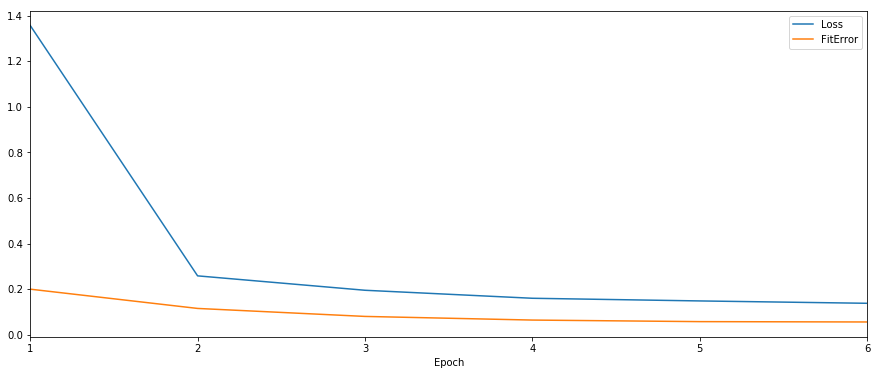

In [30]:
model1.plot_training_history(fig_size=(15, 6))

### Scoring

In [31]:
model1.predict(te_img)

[ScoreInfo]

                          Descr         Value
 0  Number of Observations Read            81
 1  Number of Observations Used            81
 2  Misclassification Error (%)      8.641975
 3                   Loss Error      0.304789

[OutputCasTables]

             casLib              Name  Rows  Columns  \
 0  CASUSER(kesmit)  Valid_Res_W9cFMe    81        8   
 
                                             casTable  
 0  CASTable('Valid_Res_W9cFMe', caslib='CASUSER(k...  

+ Elapsed: 2.8s, user: 13.3s, sys: 0.901s, mem: 1.36e+03mb

In [32]:
model1.valid_conf_mat

,_label_,Col1,Col2
0,Dolphin,43.0,4.0
1,Giraffe,3.0,31.0


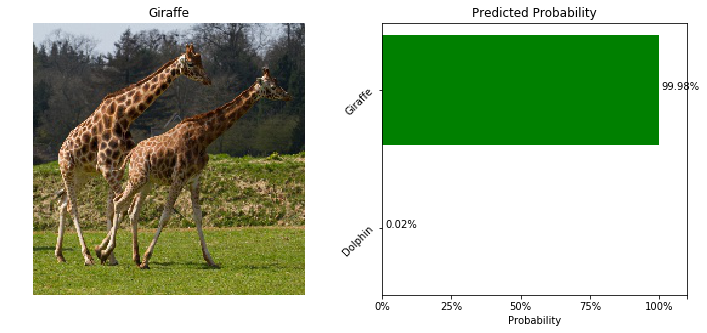

In [33]:
model1.plot_predict_res(type='C', image_id=2)

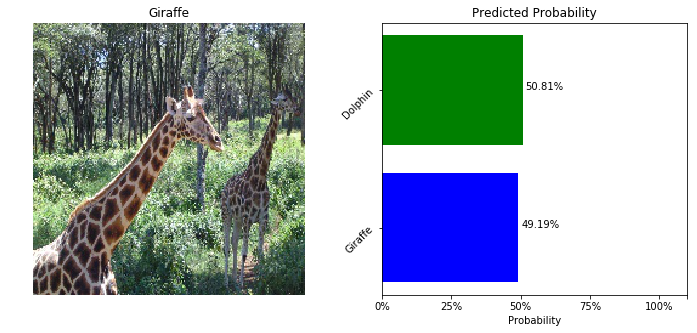

In [34]:
model1.plot_predict_res(type='M', image_id=1)

### Heatmap analysis

NOTE: The number of images in the table is too large, only 5 randomly selected images are used in analysis.
NOTE: Table IMAGEDATA_YM25XF contains compressed images.


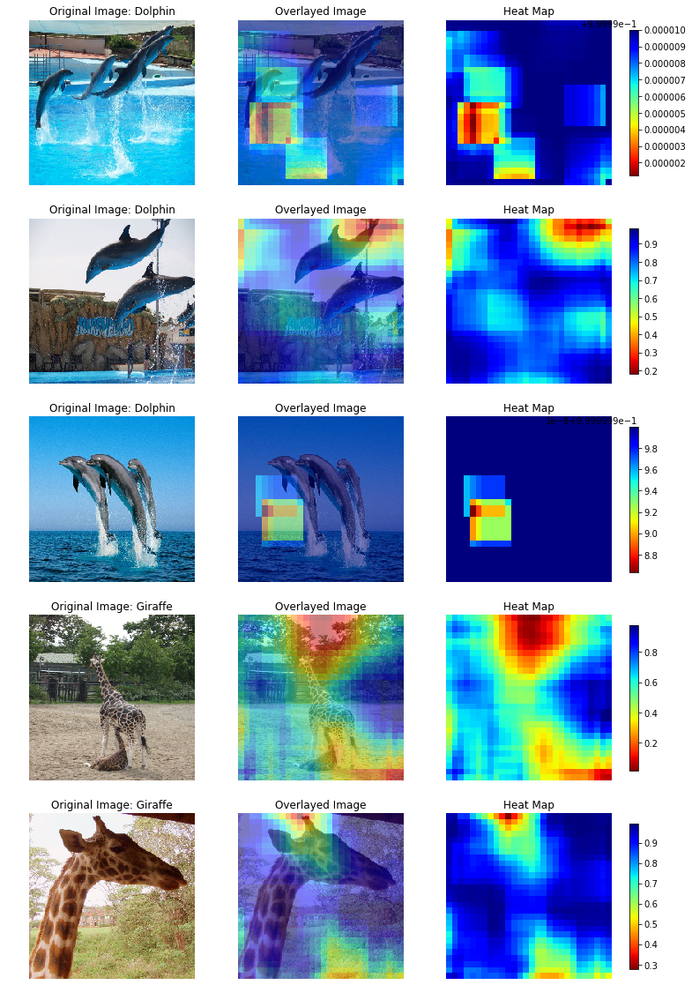

,_filename_0,_image_,_label_,heat_map
0,dolphin_10537.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Dolphin,"[[0.999999880791, 0.999999880791, 0.9999998807..."
1,dolphin_10689.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Dolphin,"[[0.468721270561, 0.468721270561, 0.4687212705..."
2,dolphin_10862.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Dolphin,"[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0,..."
3,giraffe_10579.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Giraffe,"[[0.574215054512, 0.574215054512, 0.5742150545..."
4,giraffe_10294.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Giraffe,"[[0.964730203152, 0.964730203152, 0.9647302031..."


In [35]:
model1.heat_map_analysis(data=te_img, mask_width=56, mask_height=56, step_size=8)

###  View feature maps

In [36]:
model1.get_feature_maps(data=te_img, label='Dolphin', image_id=0)

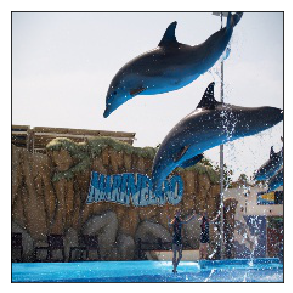

In [37]:
model1.feature_maps.display(layer_id=0)

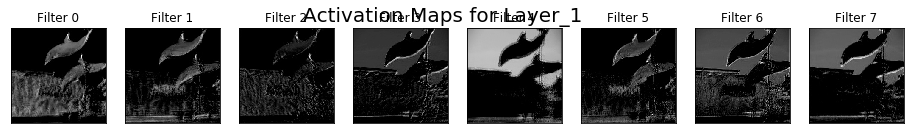

In [38]:
model1.feature_maps.display(layer_id=1)

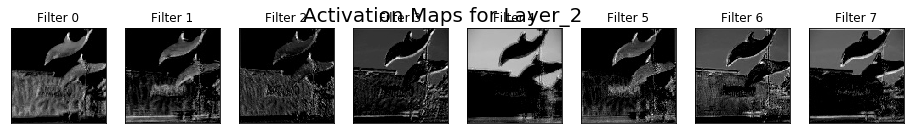

In [39]:
model1.feature_maps.display(layer_id=2)

### Save model to astore

When `astore` is specified, the model is saved to specified directory on the client side.

In [42]:
model1.deploy(path='/path/to/output_files/', output_format='astore')

NOTE: Model astore file saved successfully.


When `table` is specified, the model is saved to the specified directory on the server side in the sashdat format.

In [43]:
model1.deploy(path='/tmp/output_files/', output_format='table')

NOTE: Model table saved successfully.


## Model2: ImageNet ResNet50

In [58]:
from dlpy.applications import ResNet50_Caffe, VGG16

In [44]:
# pre_train_weight_file is a fully qualified directory for your model weights.
# Please refer to Example 2 - Pre-trained Models and Transfer Learning.ipynb for more details.

PRE_TRAIN_WEIGHT_LOC = '/path/to/imported_models/'

pre_train_weight_file = os.path.join(PRE_TRAIN_WEIGHT_LOC, 'ResNet-50-model.caffemodel.h5')

model2 = ResNet50_Caffe(sess, model_table='RESNET50_CAFFE', batch_norm_first=False,
                        n_classes=1000, n_channels=3, width=224, height=224, scale=1,
                        random_flip='none', random_crop='none',
                        offsets=(103.939, 116.779, 123.68),
                        pre_train_weight=True, 
                        pre_train_weight_file=pre_train_weight_file,
                        include_top=True)

NOTE: Model table is attached successfully!
NOTE: Model is named to "resnet50_caffe" according to the model name in the table.
NOTE: Cloud Analytic Services made the uploaded file available as table LABEL_1SFLC3 in caslib CASUSER(kesmit).
NOTE: The table LABEL_1SFLC3 has been created in caslib CASUSER(kesmit) from binary data uploaded to Cloud Analytic Services.


In [45]:
model2.print_summary()

*==================*===============*========*============*=================*======================*
|   Layer (Type)   |  Kernel Size  | Stride | Activation |   Output Size   | Number of Parameters |
*------------------*---------------*--------*------------*-----------------*----------------------*
| data(Input)      |     None      |  None  |    None    |  (224, 224, 3)  |        0 / 0         |
| conv1(Convo.)    |    (7, 7)     |   2    |  Identity  | (112, 112, 64)  |      9408 / 64       |
| bn_conv1(B.N.)   |     None      |  None  | Rectifier  | (112, 112, 64)  |       0 / 128        |
| pool1(Pool)      |    (3, 3)     |   2    |    Max     |  (56, 56, 64)   |        0 / 0         |
| res2a_branch2a...|    (1, 1)     |   1    |  Identity  |  (56, 56, 64)   |       4096 / 0       |
| bn2a_branch2a(...|     None      |  None  | Rectifier  |  (56, 56, 64)   |       0 / 128        |
| res2a_branch2b...|    (3, 3)     |   1    |  Identity  |  (56, 56, 64)   |      36864 / 0       |


**Note:** 138 million parameters!!!

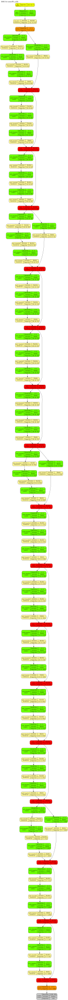

In [46]:
model2.plot_network()

### Scoring an image of Keyboard

In [47]:
# You need to specify the image path according to your own case.
new_img = ImageTable.load_files(sess, path='/path/to/images/Computer_Keyboard')

In [48]:
new_img.resize(224)

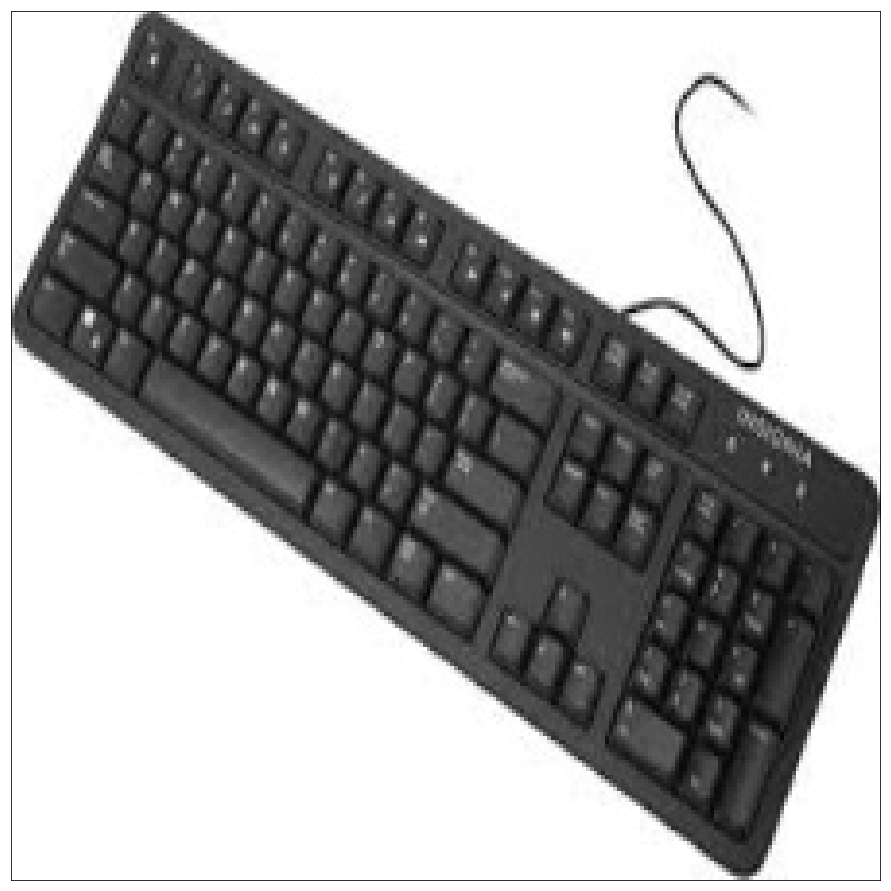

In [49]:
new_img.show()

In [50]:
model2.predict(data=new_img)

[ScoreInfo]

                          Descr         Value
 0  Number of Observations Read             1
 1  Number of Observations Used             1
 2  Misclassification Error (%)           100
 3                   Loss Error             0

[OutputCasTables]

             casLib              Name  Rows  Columns  \
 0  CASUSER(kesmit)  Valid_Res_PVe5d8     1     1006   
 
                                             casTable  
 0  CASTable('Valid_Res_PVe5d8', caslib='CASUSER(k...  

+ Elapsed: 7.06s, user: 9.68s, sys: 2.51s, mem: 3.89e+03mb

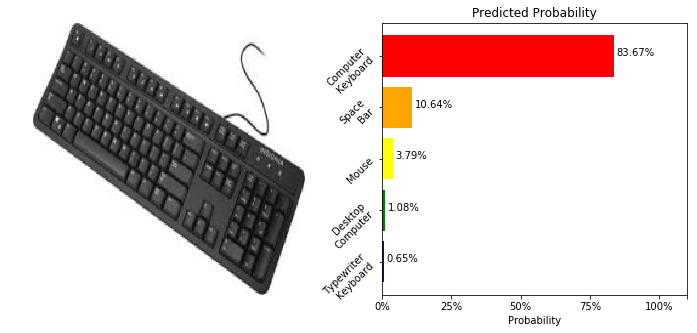

In [51]:
model2.plot_predict_res(image_id=0, type='A')

### Score the test image in the example

In [52]:
model2.predict(data=te_img)

[ScoreInfo]

                          Descr         Value
 0  Number of Observations Read            81
 1  Number of Observations Used            81
 2  Misclassification Error (%)           100
 3                   Loss Error             0

[OutputCasTables]

             casLib              Name  Rows  Columns  \
 0  CASUSER(kesmit)  Valid_Res_ZBqE3Y    81     1006   
 
                                             casTable  
 0  CASTable('Valid_Res_ZBqE3Y', caslib='CASUSER(k...  

+ Elapsed: 19s, user: 87.8s, sys: 6.05s, mem: 1.05e+04mb

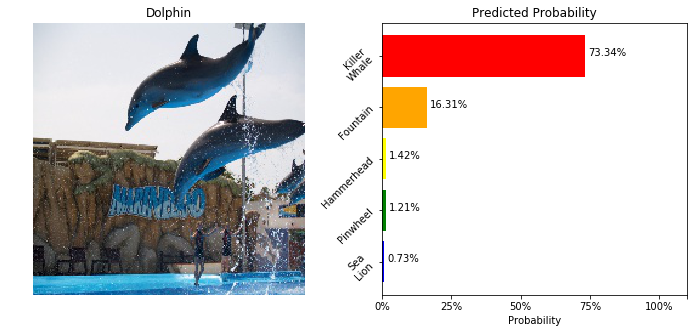

In [53]:
model2.plot_predict_res(image_id=1)

## Model3: ImageNet VGG16

In [54]:
# pre_train_weight_file is a fully qualified directory for you model weights.
# Please refer to Example 2 - Pre-trained Models and Transfer Learning.ipynb for more details.

pre_train_weight_file = os.path.join(PRE_TRAIN_WEIGHT_LOC, 'VGG_ILSVRC_16_layers.caffemodel.h5')

model3 = VGG16(sess, model_table='VGG16', 
               n_classes=1000, n_channels=3, width=224, height=224, scale=1,
               random_flip='none', random_crop='none',
               offsets=(103.939, 116.779, 123.68),
               pre_train_weight=True,
               pre_train_weight_file=pre_train_weight_file,
               include_top=True)

NOTE: Model table is attached successfully!
NOTE: Model is named to "vgg16" according to the model name in the table.
NOTE: Cloud Analytic Services made the uploaded file available as table LABEL_B1QWUL in caslib CASUSER(kesmit).
NOTE: The table LABEL_B1QWUL has been created in caslib CASUSER(kesmit) from binary data uploaded to Cloud Analytic Services.


In [55]:
model3.print_summary()

*==================*===============*========*============*=================*======================*
|   Layer (Type)   |  Kernel Size  | Stride | Activation |   Output Size   | Number of Parameters |
*------------------*---------------*--------*------------*-----------------*----------------------*
| data(Input)      |     None      |  None  |    None    |  (224, 224, 3)  |        0 / 0         |
| conv1_1(Convo.)  |    (3, 3)     |   1    | Rectifier  | (224, 224, 64)  |      1728 / 64       |
| conv1_2(Convo.)  |    (3, 3)     |   1    | Rectifier  | (224, 224, 64)  |      36864 / 64      |
| pool1(Pool)      |    (2, 2)     |   2    |    Max     | (112, 112, 64)  |        0 / 0         |
| conv2_1(Convo.)  |    (3, 3)     |   1    | Rectifier  | (112, 112, 128) |     73728 / 128      |
| conv2_2(Convo.)  |    (3, 3)     |   1    | Rectifier  | (112, 112, 128) |     147456 / 128     |
| pool2(Pool)      |    (2, 2)     |   2    |    Max     |  (56, 56, 128)  |        0 / 0         |


### Extract linear feture using ImageNet VGG16 

In [56]:
X, y = model3.get_features(data=te_img, dense_layer='pool5')

In [57]:
X, y

(array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ..., 
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.]]),
 array(['Giraffe', 'Dolphin', 'Giraffe', 'Giraffe', 'Dolphin', 'Giraffe',
        'Dolphin', 'Giraffe', 'Giraffe', 'Dolphin', 'Dolphin', 'Dolphin',
        'Giraffe', 'Giraffe', 'Giraffe', 'Giraffe', 'Dolphin', 'Dolphin',
        'Dolphin', 'Giraffe', 'Dolphin', 'Giraffe', 'Giraffe', 'Dolphin',
        'Dolphin', 'Dolphin', 'Dolphin', 'Giraffe', 'Giraffe', 'Giraffe',
        'Dolphin', 'Dolphin', 'Dolphin', 'Dolphin', 'Giraffe', 'Dolphin',
        'Giraffe', 'Giraffe', 'Giraffe', 'Dolphin', 'Dolphin', 'Giraffe',
        'Dolphin', 'Dolphin', 'Dolphin', 'Giraffe', 'Dolphin', 'Dolphin',
        'Giraffe', 'Giraffe', 'Giraffe', 'Dolphin', 'Giraffe', 'Dolphin',
        'Dolphin', 'Dolphin', 'Giraffe', 'Dolphi

### Fit a descision tree using Pipefitter

In [58]:
import pandas as pd
from pipefitter.model_selection import HyperParameterTuning
from pipefitter.estimator import DecisionTree, DecisionForest, GBTree

In [59]:
params = dict(target='label', 
              inputs=[str(i) for i in range(16)])
dtree = DecisionTree(max_depth=6, **params)
data = pd.DataFrame(X)
data['label'] = y
casdata = sess.upload_frame(data)
model = dtree.fit(casdata)
score = model.score(casdata)
score

NOTE: Cloud Analytic Services made the uploaded file available as table TMPENYBEVM_ in caslib CASUSER(kesmit).
NOTE: The table TMPENYBEVM_ has been created in caslib CASUSER(kesmit) from binary data uploaded to Cloud Analytic Services.


Target                       label
Level                        CLASS
Var                         _DT_P_
NBins                          100
NObsUsed                        81
TargetCount                     81
TargetMiss                       0
PredCount                       81
PredMiss                         0
Event                      Dolphin
EventCount                      47
NonEventCount                   34
EventMiss                        0
AreaUnderROCCurve         0.526283
CRCut                            0
ClassificationCutOff           0.5
KS                       0.0525657
KSCutOff                      0.57
MisClassificationRate      41.9753
dtype: object

### Fit a PCA model using sklearn

In [60]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

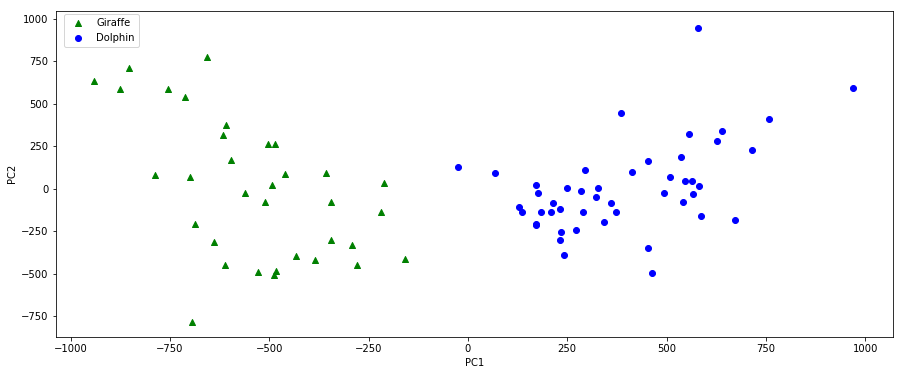

In [61]:
X_r = PCA(n_components=2).fit_transform(X)
plt.figure(figsize=(15, 6))
plt.scatter(X_r[y=='Giraffe',0], X_r[y=='Giraffe', 1], marker='^', c='g', label='Giraffe')
plt.scatter(X_r[y=='Dolphin',0], X_r[y=='Dolphin', 1], marker='o', c='b', label='Dolphin')
plt.legend(bbox_to_anchor=(0.01, 0.99), loc=2, borderaxespad=0.)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

## Model4:  Transfer Learning with ImageNet ResNet50

In [62]:
# pre_train_weight_file is a fully qualified directory for you model weights.
# Please refer to Example 2 - Pre-trained Models and Transfer Learning.ipynb for more details.

pre_train_weight_file = os.path.join(PRE_TRAIN_WEIGHT_LOC, 'ResNet-50-model.caffemodel.h5')

model4 = ResNet50_Caffe(sess, model_table='ResNet50_Caffe', 
                n_classes=2, n_channels=3, width=224, height=224, scale=1,
                random_flip='none', random_crop='none',
                offsets=tr_img.channel_means,
                pre_train_weight=True, 
                pre_train_weight_file=pre_train_weight_file,
                include_top=False)

NOTE: Model table is attached successfully!
NOTE: Model is named to "resnet50_caffe" according to the model name in the table.


In [63]:
model4.print_summary()

*==================*===============*========*============*=================*======================*
|   Layer (Type)   |  Kernel Size  | Stride | Activation |   Output Size   | Number of Parameters |
*------------------*---------------*--------*------------*-----------------*----------------------*
| data(Input)      |     None      |  None  |    None    |  (224, 224, 3)  |        0 / 0         |
| conv1(Convo.)    |    (7, 7)     |   2    |  Identity  | (112, 112, 64)  |      9408 / 64       |
| bn_conv1(B.N.)   |     None      |  None  | Rectifier  | (112, 112, 64)  |       0 / 128        |
| pool1(Pool)      |    (3, 3)     |   2    |    Max     |  (56, 56, 64)   |        0 / 0         |
| res2a_branch2a...|    (1, 1)     |   1    |  Identity  |  (56, 56, 64)   |       4096 / 0       |
| bn2a_branch2a(...|     None      |  None  | Rectifier  |  (56, 56, 64)   |       0 / 128        |
| res2a_branch2b...|    (3, 3)     |   1    |  Identity  |  (56, 56, 64)   |      36864 / 0       |


In [64]:
model4.fit(data=tr_img, mini_batch_size=1, max_epochs=3, lr=5E-3)

NOTE: Training based on existing weights.
NOTE:  The Synchronous mode is enabled.
NOTE:  The total number of parameters is 23512194.
NOTE:  The approximate memory cost is 10082.00 MB.
NOTE:  Loading weights cost       0.23 (s).
NOTE:  Initializing each layer cost       6.74 (s).
NOTE:  The total number of threads on each worker is 32.
NOTE:  The total minibatch size per thread on each worker is 1.
NOTE:  The maximum minibatch size across all workers for the synchronous mode is 32.
NOTE:  Target variable: _label_
NOTE:  Number of levels for the target variable:      2
NOTE:  Levels for the target variable:
NOTE:  Level      0: Dolphin
NOTE:  Level      1: Giraffe
NOTE:  Number of input variables:     1
NOTE:  Number of numeric input variables:      1
NOTE:  Batch              nUsed   Learning Rate     Loss    Fit Error      Time (s) (Training)
NOTE:        0               32   0.005           0.817      0.5313        12.59
NOTE:        1               32   0.005          0.4631      0.1

NOTE:        2               32   0.005          0.0102           0        12.42
NOTE:        3               32   0.005          0.0248           0        12.39
NOTE:        4               32   0.005          0.0107           0        12.35
NOTE:        5               32   0.005          0.0104           0        12.33
NOTE:        6               32   0.005          0.0238           0        12.43
NOTE:        7               32   0.005          0.0109           0        12.25
NOTE:        8               32   0.005          0.0099           0        12.18
NOTE:        9               32   0.005          0.0107           0        12.56
NOTE:       10               32   0.005          0.0127           0        12.36
NOTE:       11               32   0.005          0.0099           0        12.31
NOTE:       12               32   0.005          0.0098           0        12.22
NOTE:       13               32   0.005          0.0108           0        12.19
NOTE:       14              

,Descr,Value
0,Model Name,resnet50_caffe
1,Model Type,Convolutional Neural Network
2,Number of Layers,126
3,Number of Input Layers,1
4,Number of Output Layers,1
5,Number of Convolutional Layers,53
6,Number of Pooling Layers,2
7,Number of Fully Connected Layers,0
8,Number of Batch Normalization Layers,53
9,Number of Residual Layers,16


In [65]:
model4.training_history

,Epoch,LearningRate,Loss,FitError
0,1,0.005,0.131299,0.026677
1,2,0.005,0.024256,0.000000
2,3,0.005,0.013781,0.000000


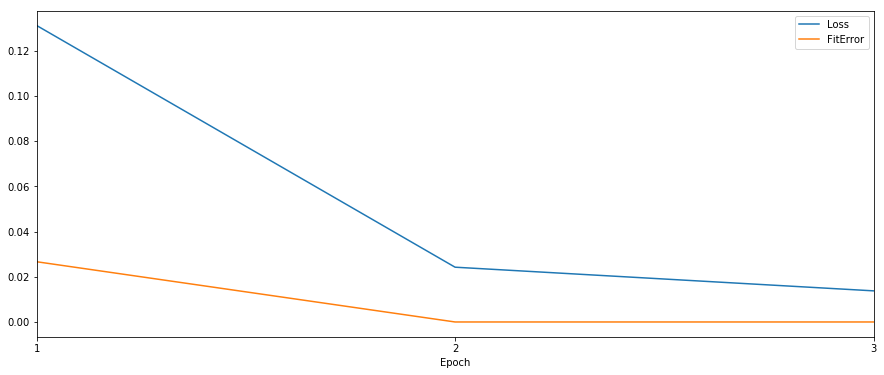

In [66]:
model4.plot_training_history(fig_size=(15, 6))

### Scoring

In [67]:
model4.predict(data=te_img)

[ScoreInfo]

                          Descr         Value
 0  Number of Observations Read            81
 1  Number of Observations Used            81
 2  Misclassification Error (%)             0
 3                   Loss Error       0.01793

[OutputCasTables]

             casLib              Name  Rows  Columns  \
 0  CASUSER(kesmit)  Valid_Res_VOEdJ3    81        8   
 
                                             casTable  
 0  CASTable('Valid_Res_VOEdJ3', caslib='CASUSER(k...  

+ Elapsed: 20.7s, user: 87.9s, sys: 6.95s, mem: 1.05e+04mb

In [68]:
model4.valid_conf_mat

,_label_,Col1,Col2
0,Dolphin,47.0,0.0
1,Giraffe,0.0,34.0


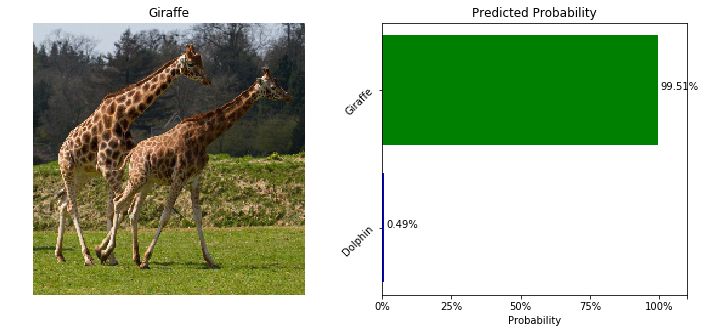

In [69]:
model4.plot_predict_res(type='C', image_id=2)

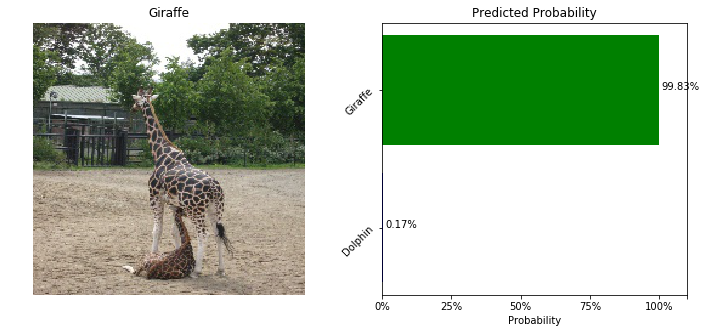

In [70]:
model4.plot_predict_res(type='A', image_id=0)

### Heatmap analysis

NOTE: The number of images in the table is too large, only 5 randomly selected images are used in analysis.
NOTE: Table IMAGEDATA_XBOSQK contains compressed images.


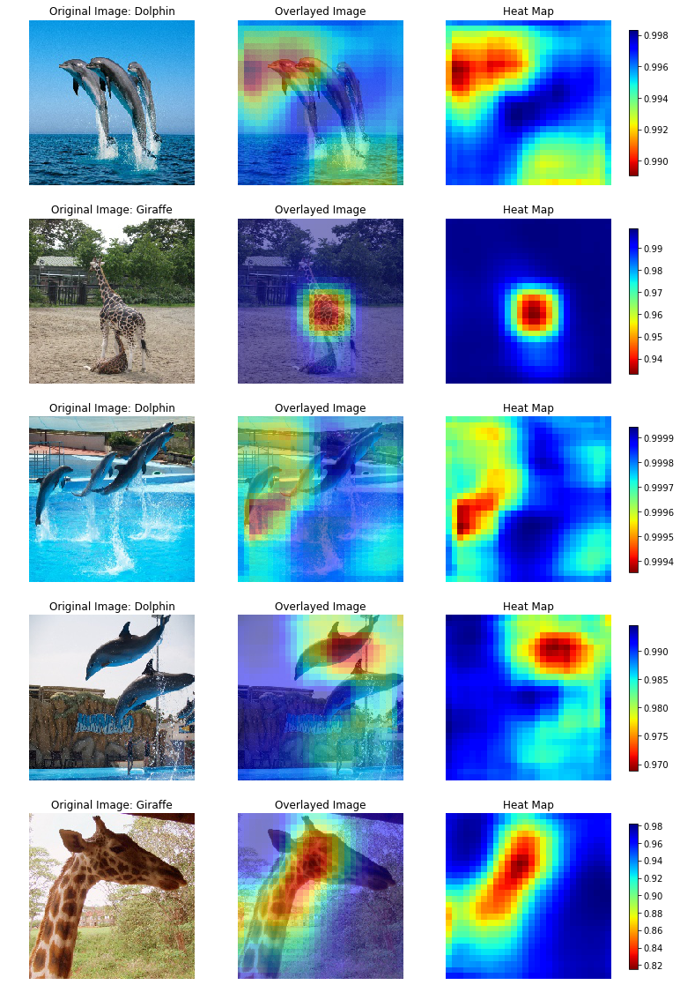

,_filename_0,_image_,_label_,heat_map
0,dolphin_10862.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Dolphin,"[[0.995748817921, 0.995748817921, 0.9957488179..."
1,giraffe_10579.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Giraffe,"[[0.997521340847, 0.997521340847, 0.9975213408..."
2,dolphin_10537.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Dolphin,"[[0.999683976173, 0.999683976173, 0.9996839761..."
3,dolphin_10689.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Dolphin,"[[0.994570076466, 0.994570076466, 0.9945700764..."
4,giraffe_10294.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Giraffe,"[[0.96817690134, 0.96817690134, 0.96817690134,..."


In [71]:
model4.heat_map_analysis(data=te_img, mask_width=56, mask_height=56, step_size=8)

## Model5: pretrained VGG16 model

In [72]:
model5 = Model(sess)

# model_file is a fully-qualified server-side directory for your model file.
# The associated weight and attribute files are all in the same directory.
# You need to modify this according to your own application.

model_file = '/path/to/pretained_models/vgg16.sashdat'

model5.load(path=model_file)

NOTE: Model table is loaded successfully!
NOTE: Model is renamed to "vgg16" according to the model name in the table.
NOTE: vgg16_weights.sashdat is used as model weigths.
NOTE: Model weights attached successfully!
NOTE: vgg16_weights_attr.sashdat is used as weigths attribute.
NOTE: Model attributes attached successfully!


In [73]:
model5.print_summary()

*==================*===============*========*============*=================*======================*
|   Layer (Type)   |  Kernel Size  | Stride | Activation |   Output Size   | Number of Parameters |
*------------------*---------------*--------*------------*-----------------*----------------------*
| data(Input)      |     None      |  None  |    None    |  (224, 224, 3)  |        0 / 0         |
| conv1_1(Convo.)  |    (3, 3)     |   1    | Rectifier  | (224, 224, 64)  |      1728 / 64       |
| conv1_2(Convo.)  |    (3, 3)     |   1    | Rectifier  | (224, 224, 64)  |      36864 / 64      |
| pool1(Pool)      |    (2, 2)     |   2    |    Max     | (112, 112, 64)  |        0 / 0         |
| conv2_1(Convo.)  |    (3, 3)     |   1    | Rectifier  | (112, 112, 128) |     73728 / 128      |
| conv2_2(Convo.)  |    (3, 3)     |   1    | Rectifier  | (112, 112, 128) |     147456 / 128     |
| pool2(Pool)      |    (2, 2)     |   2    |    Max     |  (56, 56, 128)  |        0 / 0         |


## Scoring

In [74]:
model5.predict(te_img)

[ScoreInfo]

                          Descr         Value
 0  Number of Observations Read            81
 1  Number of Observations Used            81
 2  Misclassification Error (%)             0
 3                   Loss Error      0.000987

[OutputCasTables]

             casLib              Name  Rows  Columns  \
 0  CASUSER(kesmit)  Valid_Res_GimaO7    81        8   
 
                                             casTable  
 0  CASTable('Valid_Res_GimaO7', caslib='CASUSER(k...  

+ Elapsed: 28s, user: 296s, sys: 7.54s, mem: 1.03e+04mb

In [75]:
model5.valid_conf_mat

,_label_,Col1,Col2
0,Dolphin,47.0,0.0
1,Giraffe,0.0,34.0


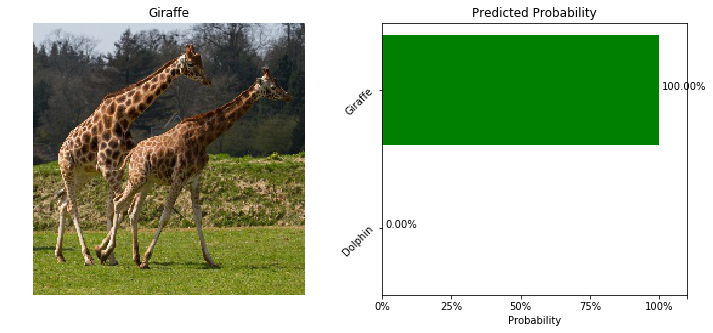

In [76]:
model5.plot_predict_res(type='C', image_id=2)

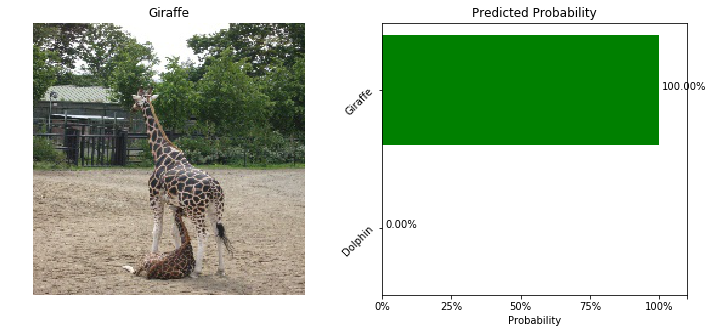

In [77]:
model5.plot_predict_res(type='A', image_id=0)

NOTE: The number of images in the table is too large, only 5 randomly selected images are used in analysis.
NOTE: Table IMAGEDATA_FZ3PV5 contains compressed images.


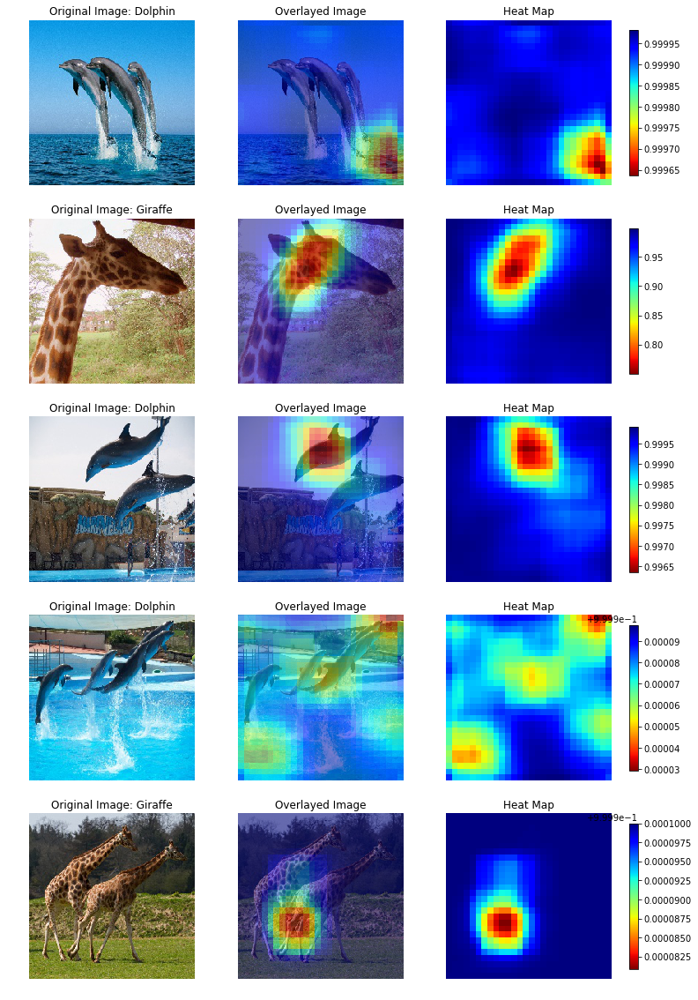

,_filename_0,_image_,_label_,heat_map
0,dolphin_10862.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Dolphin,"[[0.999964356422, 0.999964356422, 0.9999643564..."
1,giraffe_10294.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Giraffe,"[[0.998145699501, 0.998145699501, 0.9981456995..."
2,dolphin_10689.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Dolphin,"[[0.999901652336, 0.999901652336, 0.9999016523..."
3,dolphin_10537.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Dolphin,"[[0.999980568886, 0.999980568886, 0.9999805688..."
4,giraffe_10873.jpg,<PIL.JpegImagePlugin.JpegImageFile image mode=...,Giraffe,"[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0,..."


In [78]:
model5.heat_map_analysis(data=te_img, mask_width=56, mask_height=56, step_size=8)

## View feature maps

In [79]:
model5.get_feature_maps(data=te_img, label='Dolphin', image_id=0)

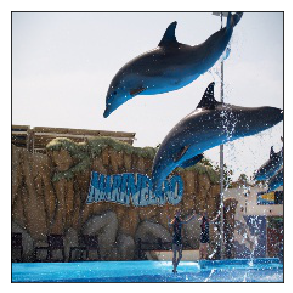

In [80]:
model5.feature_maps.display(layer_id=0)

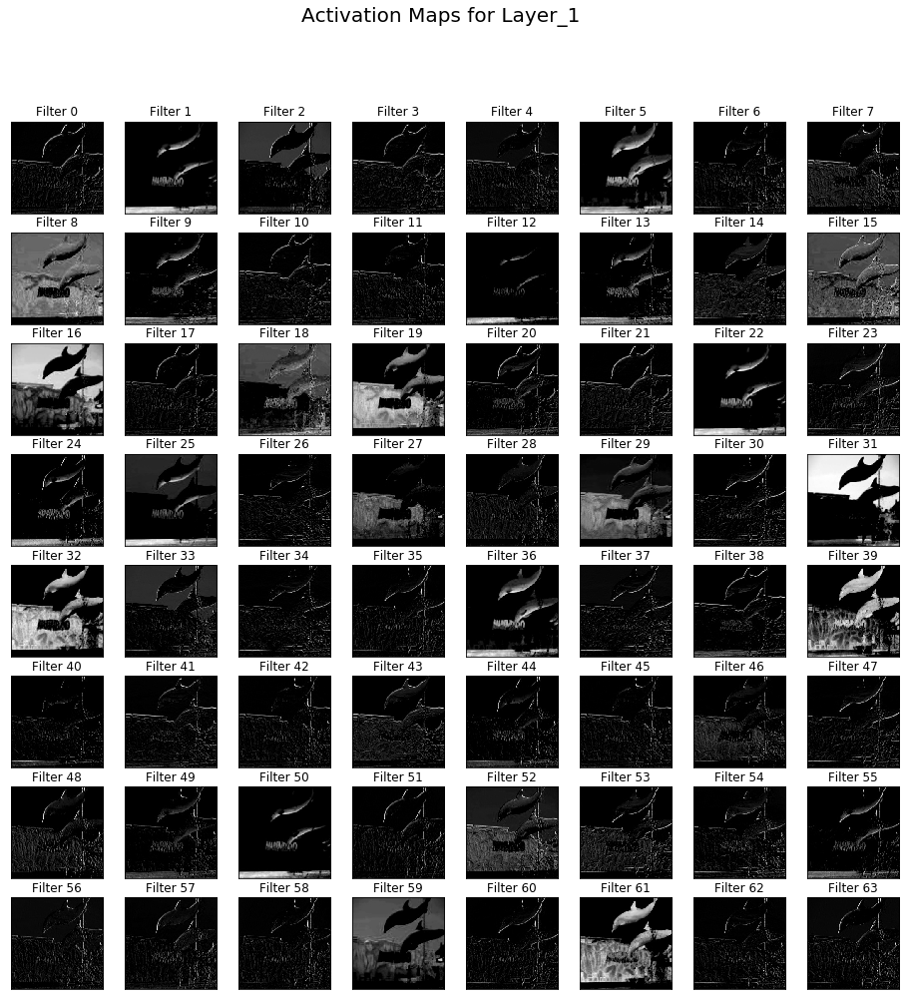

In [81]:
model5.feature_maps.display(layer_id=1)

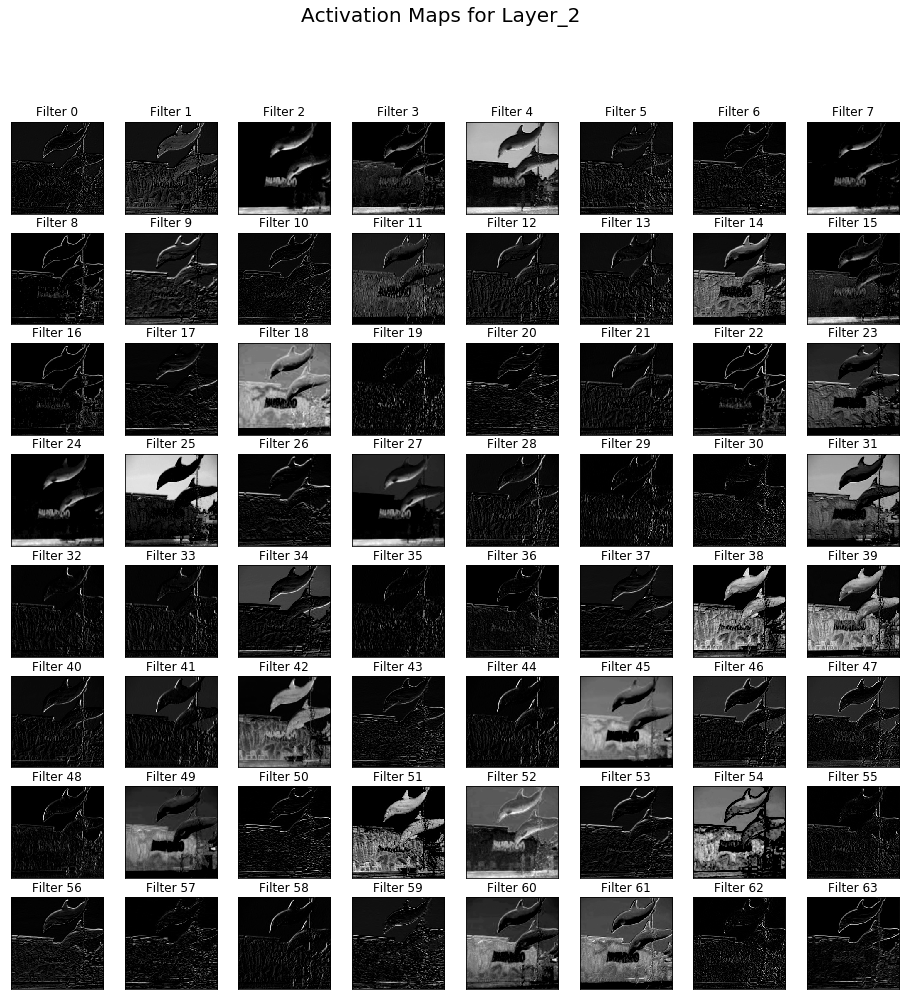

In [82]:
model5.feature_maps.display(layer_id=2)

NOTE: The maximum number of filters to be displayed is 64.
NOTE: Only the first 64 filters are displayed.


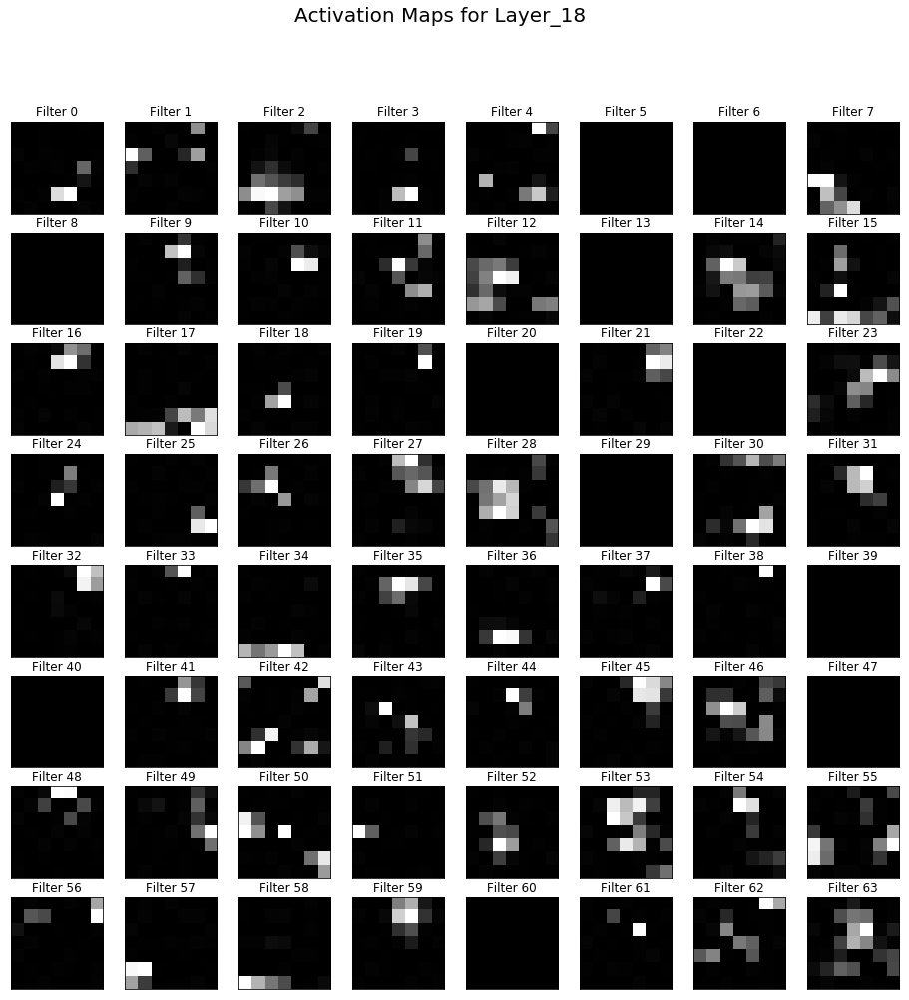

In [83]:
model5.feature_maps.display(layer_id=18)

In [84]:
sess.terminate()